# human SKM single-nuclei MYH 3d plotting

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

sc.logging.print_version_and_date()

Global seed set to 0


Running Scanpy 1.9.1, on 2023-06-13 19:42.


/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
import plot3d_2

In [18]:
adata_sc = sc.read('./write/ICM_myonuclei_scvi1_dbrm_2023-05-07_mftype_upd.h5ad')

In [19]:
adata_sc

AnnData object with n_obs × n_vars = 74626 × 33538
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'leiden_r1.6', 'leiden_r2', 'leiden_r3', 'leiden_r', 'manual_anno', 'myofiber_fine_predicted_labels', 'myofiber_fine_over_clustering', 'myofiber_fine_majority_voting', 'myofiber_fine_conf_score', 'manual_anno2', 'annotation_level0', 'annotation_level1', 'MYH7+', 'MYH1+', 'MYH2+', 'myofiber_type', 'myofiber_type_filt', 'myofiber_type2'
    var:

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



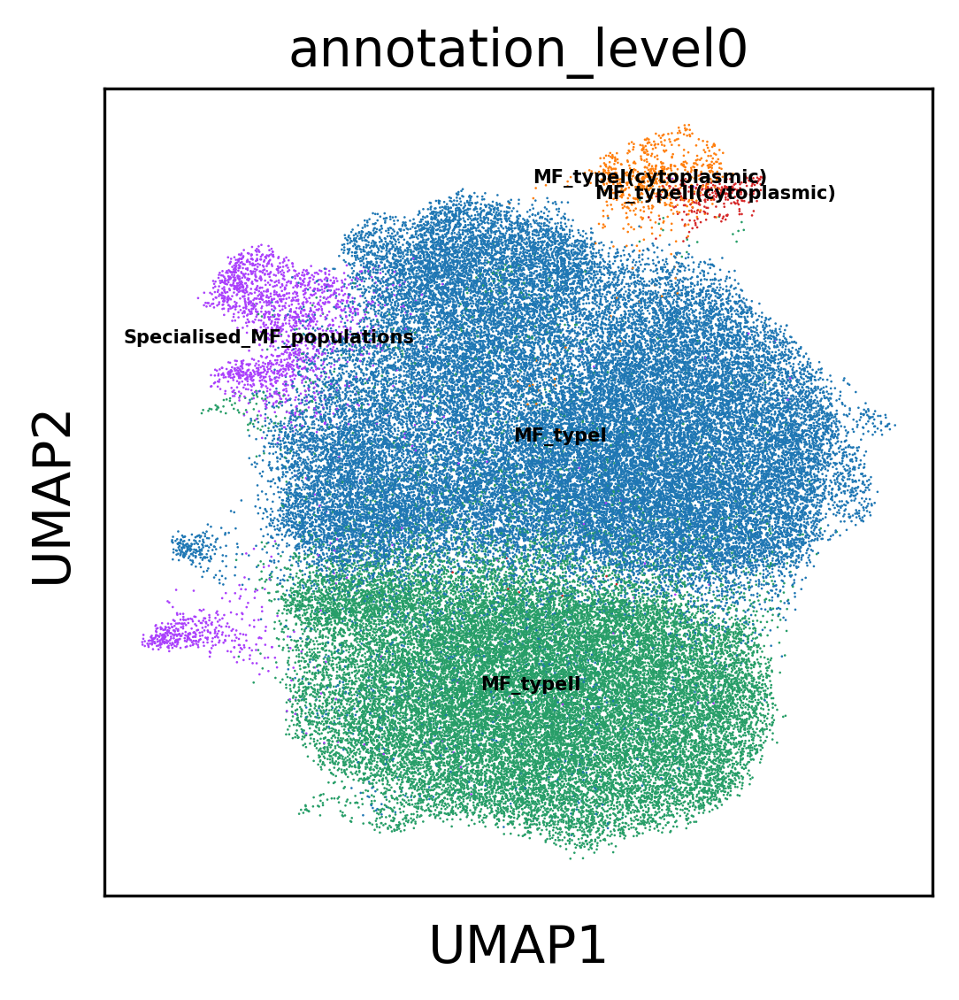

In [20]:
sc.pl.umap(adata_sc,color=['annotation_level0'],legend_fontsize=5,legend_loc='on data')

/home/LiuTL/anaconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



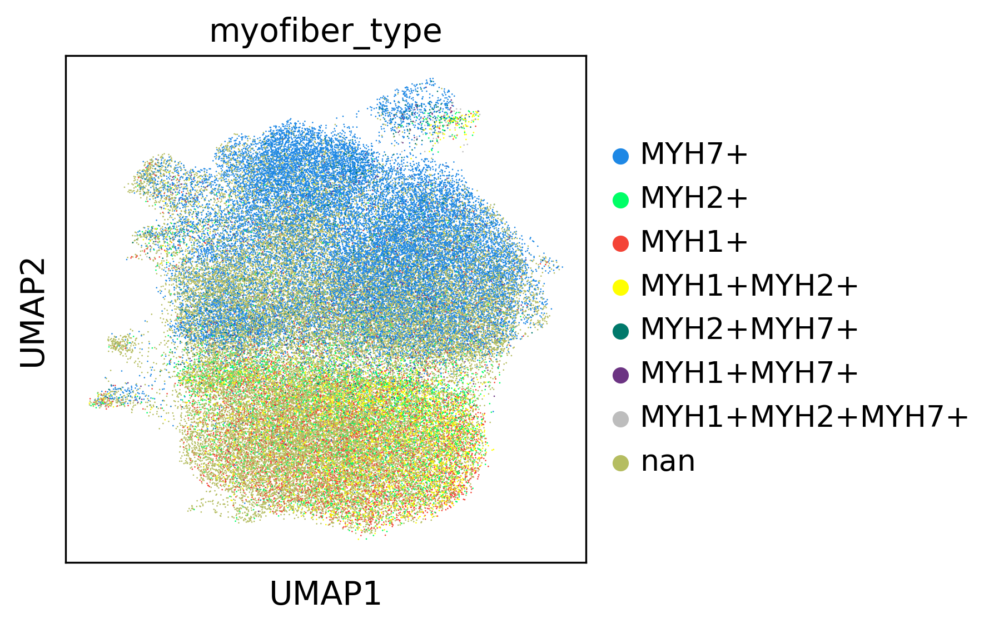

In [21]:
sc.pl.umap(adata_sc,color=['myofiber_type'],)

In [22]:
mtx = adata_sc[:,['MYH1','MYH2','MYH7']].X.todense()

In [24]:
adata_sc.obsm['MYH_embed'] = mtx

In [25]:
adata_sc

AnnData object with n_obs × n_vars = 74626 × 33538
    obs: 'SampleID', 'barcode', 'concat_sample_no', 'DonorID', 'Sex', 'Age', 'Species', 'Operator', 'Sample', '10X_version', 'n_counts', 'n_counts_raw', 'percent_soup', 'n_counts_spliced', 'n_counts_unspliced', 'percent_spliced', 'n_genes', 'percent_mito', 'percent_ribo', 'percent_hb', 'Age_group', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'leiden', 'fine_predicted_labels', 'fine_over_clustering', 'fine_majority_voting', 'fine_conf_score', 'coarse_predicted_labels', 'coarse_over_clustering', 'coarse_majority_voting', 'coarse_conf_score', 'leiden_r1.6', 'leiden_r2', 'leiden_r3', 'leiden_r', 'manual_anno', 'myofiber_fine_predicted_labels', 'myofiber_fine_over_clustering', 'myofiber_fine_majority_voting', 'myofiber_fine_conf_score', 'manual_anno2', 'annotation_level0', 'annotation_level1', 'MYH7+', 'MYH1+', 'MYH2+', 'myofiber_type', 'myofiber_type_filt', 'myofiber_type2'
    var:

In [26]:
plot3d_2.draw_3d_by_group(adata_sc,group_key='myofiber_type',component='MYH_embed',size=3,opacity=0.8)